In [67]:
print('Mi proyecto de Grado: Rockola')

Mi proyecto de Grado: Rockola


# Fase 2. Comprender los datos

En esta fase la idea es revisar como se distribuyen las canciones preseleccionadas y revisar como se distribuyen sus variables. 

## Visualizaciòn Preseleccion Canciones

In [2]:
# Basis
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# APIS Datos
from datetime import datetime, timedelta
import re
import csv
import json
from pickle import load

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [111]:
with open('archivo.json', 'r') as archivo:
    Agg = json.load(archivo)

Agg = pd.DataFrame(Agg)

with open ('RepCanciones.json','r') as Rep:
    Repetidas = json.load(Rep)

Repetidas = pd.DataFrame(Repetidas)

with open ('BDPys.json','r') as BDPys:
  ListaPys = json.load(BDPys)

Listas = pd.DataFrame(ListaPys)

Analisis de Playlist 
Numero de Listas Revisadas:  405
Numero de playlists Repetidas:  0
Por Categoria:
 Rock       97
Groove     88
Cumbia     85
Pop        84
Hip-hop    51
Name: Genero Dif, dtype: int64


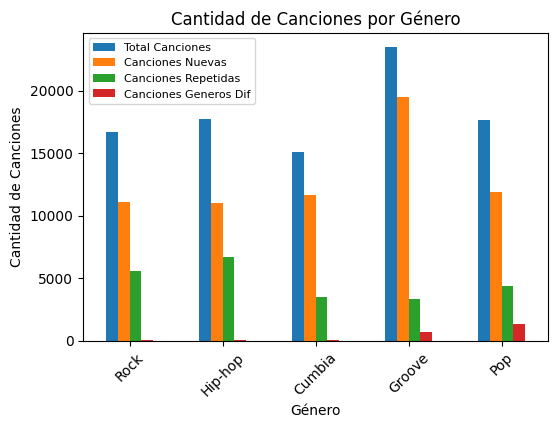

In [16]:
# Analisis de Playlist Recolectadas

print('Analisis de Playlist \nNumero de Listas Revisadas: ', Listas.shape[0])
Pys_duplicada = Listas['ID'].duplicated()
Pys_duplicada = Listas[Pys_duplicada]
print('Numero de playlists Repetidas: ', Pys_duplicada.shape[0])

Pys_xgen = Listas['Genero Dif'].value_counts()
print('Por Categoria:\n',Pys_xgen)

orden_generos = ['Rock', 'Hip-hop', 'Cumbia', 'Groove', 'Pop']

grouped_pys = Listas.groupby('Genero Dif').sum(numeric_only=True)
grouped_pys = grouped_pys.reindex(orden_generos)

fig, ax = plt.subplots(figsize=(6, 4))
grouped_pys[['Total Canciones', 'Canciones Nuevas', 'Canciones Repetidas', 'Canciones Generos Dif']].plot(kind='bar', ax=ax)
plt.xlabel('Género')
plt.ylabel('Cantidad de Canciones')
plt.title('Cantidad de Canciones por Género')
plt.legend(["Total Canciones", "Canciones Nuevas", "Canciones Repetidas", "Canciones Generos Dif"], fontsize = 8)
plt.xticks(rotation=45)
ax.tick_params(axis='x', labelsize=10) 
plt.show()

In [17]:
print('Analisis de Canciones Seleccionadas\nNúmero de canciones revisadas:', Agg.shape[0],'\nCanciones por Genero:')
Agg_xgen = Agg['genero'].value_counts()
print(Agg_xgen)

Agg_pre= Agg[Agg['rep'] >= 2]

print("\nNúmero de filas con rep igual o mayor que 2:", Agg_pre.shape[0])

print('Canciones por Genero:')
Agg_prexgen = Agg_pre['genero'].value_counts()
print(Agg_prexgen)


Analisis de Canciones Seleccionadas
Número de canciones revisadas: 65146 
Canciones por Genero:
Groove     19500
Pop        11908
Cumbia     11643
Rock       11081
Hip-hop    11014
Name: genero, dtype: int64

Número de filas con rep igual o mayor que 2: 12804
Canciones por Genero:
Hip-hop    3814
Rock       2669
Cumbia     2172
Groove     2092
Pop        2057
Name: genero, dtype: int64


Canciones clasificadas en 2 o mas generos: 1349


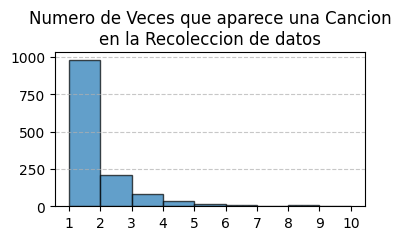

In [18]:
# Analisis Canciones con Diferentes Generos
dif_gen = Repetidas.groupby(['ID', 'Cancion']).agg({'rep': 'count'}).reset_index()
dif_gen = dif_gen.sort_values(by='rep', ascending= False)
print('Canciones clasificadas en 2 o mas generos:',dif_gen.shape[0])

tf_dif_gen = dif_gen.groupby(['rep']).size().reset_index(name='Frecuencia')

plt.figure(figsize=(4, 2))
plt.hist(dif_gen['rep'], bins=range(1, 11), edgecolor='k', alpha=0.7)
plt.title('Numero de Veces que aparece una Cancion\nen la Recoleccion de datos')
plt.xticks(range(1, 11))
plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.show()


In [19]:

Agg_pre = Agg_pre[~Agg_pre['ID'].isin(dif_gen['ID'])]
print('Canciones Preseleccionadas:',Agg_pre.shape[0])
print('\nCanciones por Genero Preseleccionadas:')
Agg_prexgen = Agg_pre['genero'].value_counts()
print(Agg_prexgen)

with open ('Ajustes_canciones.json','r') as ajustes_canciones:
  Ajustes = json.load(ajustes_canciones)

Ajustes = pd.DataFrame(Ajustes)
print('\nCanciones Agregadas por Ajustes:' , Ajustes.shape[0])
Agg_final = pd.concat([Agg_pre, Ajustes], ignore_index=True)
print('Canciones despues de filtros:' , Agg_final.shape[0])
Agg_final = Agg_final.groupby('genero').apply(lambda x: x.nlargest(2000, 'rep')).reset_index(drop=True)
print('\nPor diseño de experimento se utilizan solo 10000 Canciones:')
Agg_final_prexgen = Agg_final['genero'].value_counts()
print(Agg_final_prexgen)

Canciones Preseleccionadas: 11455

Canciones por Genero Preseleccionadas:
Hip-hop    3473
Pop        2050
Cumbia     2007
Rock       1971
Groove     1954
Name: genero, dtype: int64

Canciones Agregadas por Ajustes: 87
Canciones despues de filtros: 11542

Por diseño de experimento se utilizan solo 10000 Canciones:
Cumbia     2000
Groove     2000
Hip-hop    2000
Pop        2000
Rock       2000
Name: genero, dtype: int64


## Descripciòn Datos

In [179]:
with open('Canciones_final_b0.json', 'r') as archivo:
    final = json.load(archivo)

final = pd.DataFrame(final)

In [180]:
final_prexgen_b0 = final['categoria'].value_counts()
print(final_prexgen_b0)

Cumbia     180
Groove     180
Hip-hop    180
Pop        180
Rock       180
Name: categoria, dtype: int64


In [181]:
print(final.dtypes)

id                    object
categoria             object
acousticness         float64
danceability         float64
duration_ms            int64
energy               float64
instrumentalness     float64
key                    int64
liveness             float64
loudness             float64
mode                   int64
speechiness          float64
tempo                float64
time_signature         int64
valence              float64
num_samples            int64
duration_t           float64
end_of_fade_in       float64
start_of_fade_out    float64
bars                  object
beats                 object
sections              object
segments              object
tatums                object
dtype: object


In [182]:
final.drop(columns=['id', 'bars', 'beats', 'sections', 'segments', 'tatums'], inplace=True)

# Agregar dos dimensiones basadas en los fades sobre la duration_t
final['fade_in_duration'] = final['end_of_fade_in'] / final['duration_t']
final['fade_out_duration'] = (final['duration_t'] - final['start_of_fade_out'] ) / final['duration_t']

final.head()

,categoria,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,num_samples,duration_t,end_of_fade_in,start_of_fade_out,fade_in_duration,fade_out_duration
0,Cumbia,0.414,0.607,293893,0.622,0.000000,2,0.1760,-9.433,0,0.0354,82.777,4,0.660,6480348,293.89334,0.17383,290.34810,0.000591,0.012063
1,Cumbia,0.128,0.718,254867,0.748,0.000015,8,0.1410,-7.875,1,0.0648,94.136,4,0.935,5619810,254.86667,0.62771,250.71165,0.002463,0.016303
2,Cumbia,0.549,0.704,228554,0.884,0.000364,8,0.0492,-6.275,1,0.0527,93.058,4,0.964,5039616,228.55402,0.00000,225.07101,0.000000,0.015239
3,Cumbia,0.690,0.654,309920,0.720,0.000000,8,0.2000,-7.731,1,0.0395,99.911,4,0.678,6833736,309.92000,0.67016,305.53976,0.002162,0.014133
4,Cumbia,0.779,0.556,321707,0.704,0.000011,1,0.1090,-5.036,1,0.0337,91.465,4,0.843,7093632,321.70667,0.11025,315.59402,0.000343,0.019001


In [183]:
final_num = final.drop(columns=['end_of_fade_in','start_of_fade_out'], inplace=True)

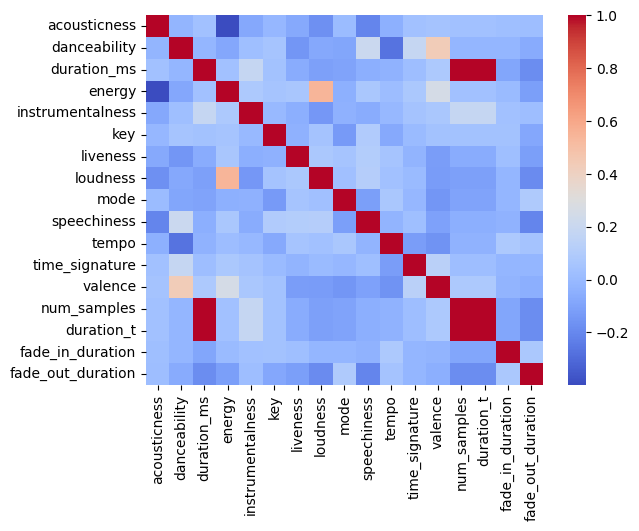

<Figure size 1600x1600 with 0 Axes>

In [184]:
import seaborn as sns
import matplotlib.pyplot as plt

matriz_de_correlacion = final.corr()

sns.heatmap(matriz_de_correlacion, annot=False, cmap='coolwarm')
plt.figure(figsize=(16, 16))
plt.show()

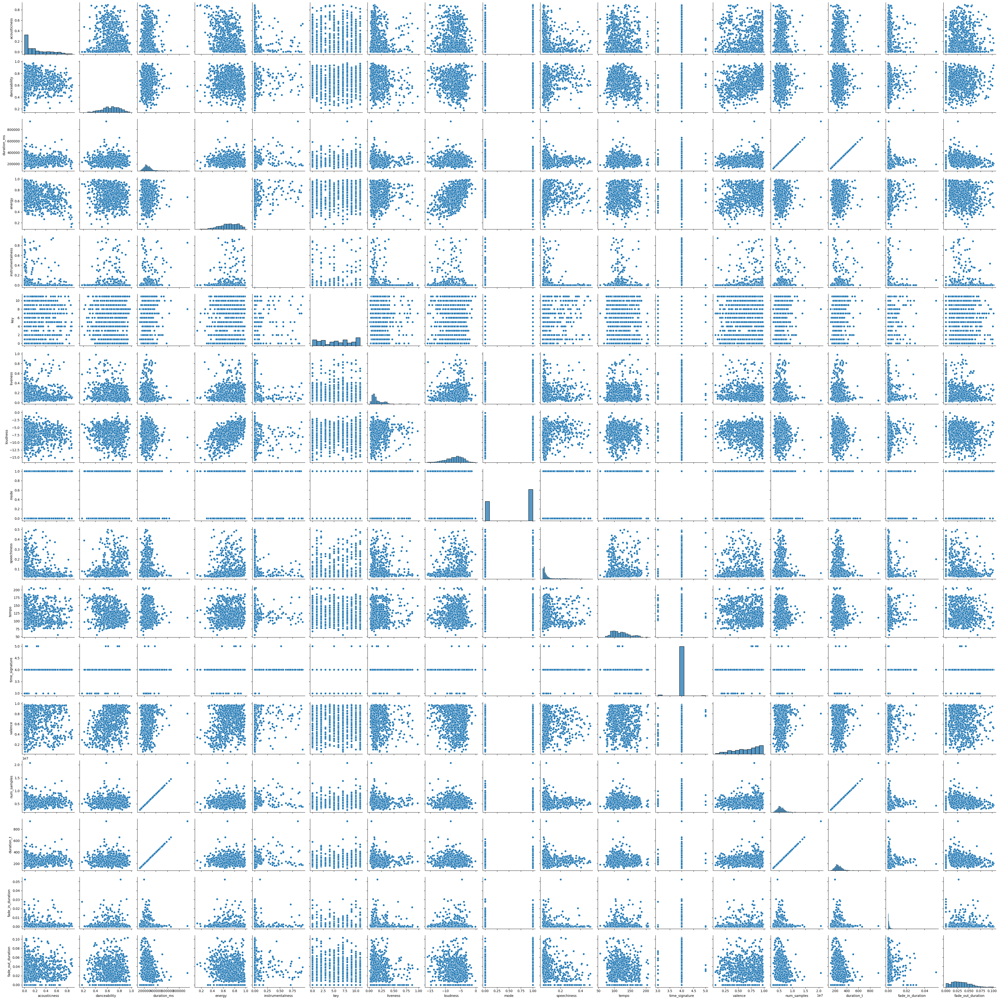

In [185]:
sns.pairplot(final)

In [187]:
finalcor = final

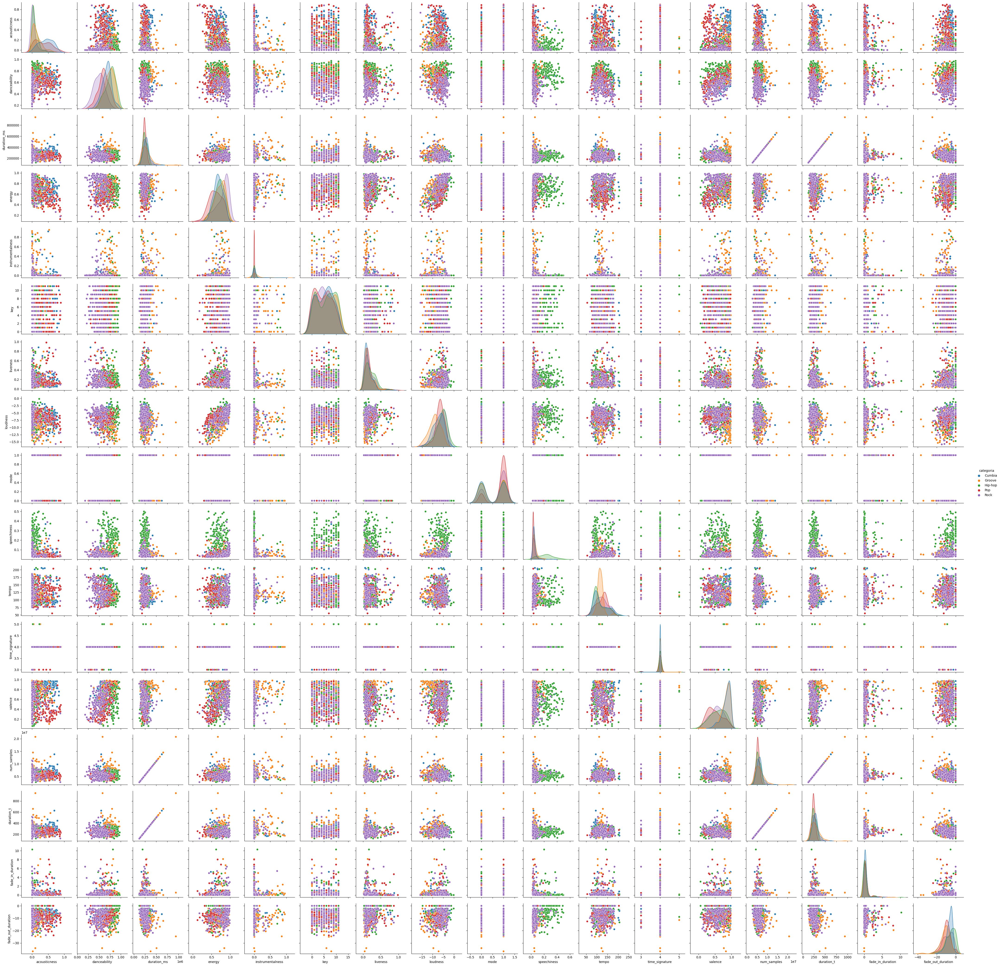

In [14]:
finalcor = final
sns.pairplot(finalcor, hue="categoria")
plt.show()

In [188]:
finalcor.describe()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,num_samples,duration_t,fade_in_duration,fade_out_duration
count,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,9.000000e+02,900.000000,900.000000,9.000000e+02
mean,0.220023,0.655751,260091.240000,0.701786,0.036746,5.272222,0.181477,-7.043798,0.618889,0.088091,120.146614,3.985556,0.657417,5.735002e+06,260.090800,0.001932,3.301287e-02
std,0.229320,0.150858,70436.349369,0.160682,0.133477,3.574459,0.149977,2.756491,0.485930,0.090732,27.399511,0.152153,0.238439,1.553129e+06,70.436678,0.004181,2.053137e-02
min,0.000018,0.179000,121160.000000,0.128000,0.000000,0.000000,0.016500,-15.882000,0.000000,0.024000,55.395000,3.000000,0.059100,2.671578e+06,121.160000,0.000000,-1.469580e-07
25%,0.028100,0.550750,216710.750000,0.593000,0.000000,2.000000,0.083175,-8.818750,0.000000,0.035700,97.460500,4.000000,0.484000,4.778468e+06,216.710547,0.000000,1.764935e-02
50%,0.136500,0.671000,248960.000000,0.712000,0.000008,5.000000,0.127000,-6.659500,1.000000,0.048450,115.995500,4.000000,0.704000,5.489568e+06,248.960000,0.000793,3.106459e-02
75%,0.384000,0.768000,292875.500000,0.833000,0.001073,8.000000,0.242000,-5.005250,1.000000,0.086925,137.205500,4.000000,0.864500,6.457912e+06,292.875828,0.001685,4.579185e-02
max,0.895000,0.975000,941360.000000,0.988000,0.951000,11.000000,0.984000,-0.140000,1.000000,0.499000,206.247000,5.000000,0.983000,2.075699e+07,941.360000,0.052448,1.030860e-01


In [189]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
columnas_std = ['key', 'tempo', 'duration_ms','num_samples']

scaler = MinMaxScaler()
finalcor[columnas_std] = scaler.fit_transform(finalcor[columnas_std])

maximo = finalcor["duration_t"].max()
finalcor["fade_in_duration"] = finalcor["fade_in_duration"] / maximo
finalcor["fade_out_duration"] = finalcor["fade_out_duration"] / maximo

nuevo_minimo = 0
nuevo_maximo = 1
finalcor["loudness"] = -finalcor["loudness"]
finalcor["loudness"] = ((finalcor["loudness"] - finalcor["loudness"].min()) /
                                              (finalcor["loudness"].max() - finalcor["loudness"].min()) *
                                              (nuevo_maximo - nuevo_minimo) + nuevo_minimo)

finalcor["time_signature"] = ((finalcor["time_signature"] - 3) / (7- 3) * (nuevo_maximo - nuevo_minimo) + nuevo_minimo)
finalcor.describe()

,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,num_samples,duration_t,fade_in_duration,fade_out_duration
count,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,900.000000,9.000000e+02,9.000000e+02
mean,0.220023,0.655751,0.169387,0.701786,0.036746,0.479293,0.181477,0.438559,0.618889,0.088091,0.429239,0.246389,0.657417,0.169386,260.090800,2.051908e-06,3.506933e-05
std,0.229320,0.150858,0.085877,0.160682,0.133477,0.324951,0.149977,0.175104,0.485930,0.090732,0.181632,0.038038,0.238439,0.085877,70.436678,4.441189e-06,2.181033e-05
min,0.000018,0.179000,0.000000,0.128000,0.000000,0.000000,0.016500,0.000000,0.000000,0.024000,0.000000,0.000000,0.059100,0.000000,121.160000,0.000000e+00,-1.561124e-10
25%,0.028100,0.550750,0.116497,0.593000,0.000000,0.181818,0.083175,0.309062,0.000000,0.035700,0.278853,0.250000,0.484000,0.116497,216.710547,0.000000e+00,1.874878e-05
50%,0.136500,0.671000,0.155816,0.712000,0.000008,0.454545,0.127000,0.414147,1.000000,0.048450,0.401722,0.250000,0.704000,0.155816,248.960000,8.423667e-07,3.299969e-05
75%,0.384000,0.768000,0.209358,0.833000,0.001073,0.727273,0.242000,0.551312,1.000000,0.086925,0.542323,0.250000,0.864500,0.209358,292.875828,1.790128e-06,4.864435e-05
max,0.895000,0.975000,1.000000,0.988000,0.951000,1.000000,0.984000,1.000000,1.000000,0.499000,1.000000,0.500000,0.983000,1.000000,941.360000,5.571477e-05,1.095076e-04


In [191]:
finalcor.drop(columns=["categoria","duration_t",'num_samples'], inplace=True)

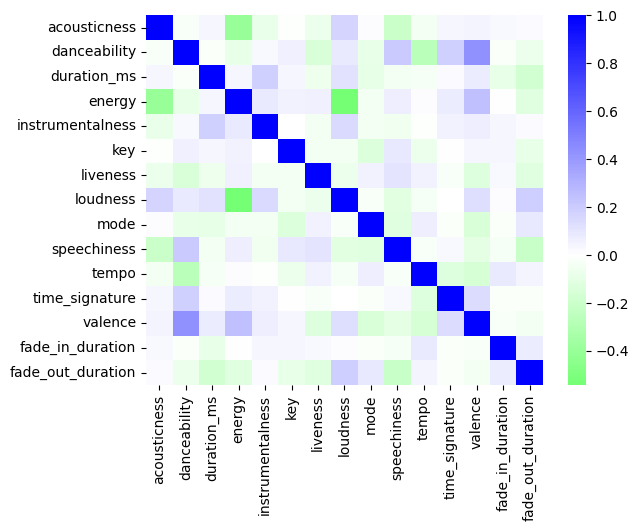

<Figure size 1600x1600 with 0 Axes>

In [192]:
from matplotlib.colors import LinearSegmentedColormap

matriz_de_correlacion = finalcor.corr()
custom_cmap = LinearSegmentedColormap.from_list('custom', ['#00FF00','#FFFFFF', '#0000FF',  ])
sns.heatmap(matriz_de_correlacion, annot=False, cmap=custom_cmap, center= 0)
plt.figure(figsize=(16, 16))
plt.show()

In [193]:
finalcor.dtypes

acousticness         float64
danceability         float64
duration_ms          float64
energy               float64
instrumentalness     float64
key                  float64
liveness             float64
loudness             float64
mode                   int64
speechiness          float64
tempo                float64
time_signature       float64
valence              float64
fade_in_duration     float64
fade_out_duration    float64
dtype: object

# Fase 3. Preparaciòn datos
En esta fase vamos a agrupar la informaciòn recolectada y estandarizar sus variables

## Agrupar Datos 

In [4]:
with open('Canciones_final_b0.json', 'r') as archivo:
    b0 = json.load(archivo)
b0 = pd.DataFrame(b0)

with open('Canciones_final_b1.json', 'r') as archivo:
    b1 = json.load(archivo)
b1 = pd.DataFrame(b1)

with open('Canciones_final_b2.json', 'r') as archivo:
    b2 = json.load(archivo)
b2 = pd.DataFrame(b2)

with open('Canciones_final_b3.json', 'r') as archivo:
    b3 = json.load(archivo)
b3 = pd.DataFrame(b3)

with open('Canciones_final_b4.json', 'r') as archivo:
    b4 = json.load(archivo)
b4 = pd.DataFrame(b4)

with open('Canciones_final_b5.json', 'r') as archivo:
    b5 = json.load(archivo)
b5 = pd.DataFrame(b5)

with open('Canciones_final_b6.json', 'r') as archivo:
    b6 = json.load(archivo)
b6 = pd.DataFrame(b6)

with open('Canciones_final_b7.json', 'r') as archivo:
    b7 = json.load(archivo)
b7 = pd.DataFrame(b7)

with open('Canciones_final_b8.json', 'r') as archivo:
    b8 = json.load(archivo)
b8 = pd.DataFrame(b8)

In [5]:
todoelset = pd.concat([b0,b1,b2,b3,b4,b5,b6,b7,b8], ignore_index=True)
print(todoelset.shape)

(8001, 24)


In [6]:
with open('Canciones_muestras.json', 'r') as archivo:
    bmuestra = json.load(archivo)
bmuestra = pd.DataFrame(bmuestra)

print(bmuestra.shape)

(150, 24)


In [69]:
import csv

csv_file_path = 'muestras_meta.csv'  
Gen_muestra = []
with open(csv_file_path, 'r', newline='', encoding='utf-8') as csvfile:
    reader = csv.DictReader(csvfile)
    for row in reader:
        Gen_muestra.append(row)

print(Gen_muestra)


[{'artistas': 'Rudimental', 'cancion_name': 'Easy On Me'}, {'artistas': 'The Jackson 5', 'cancion_name': 'I Want You Back'}, {'artistas': 'Masego', 'cancion_name': 'Tadow'}, {'artistas': 'CHIC', 'cancion_name': 'I Want Your Love'}, {'artistas': 'Gwen McCrae', 'cancion_name': 'Funky Sensation'}, {'artistas': 'Michael Jackson', 'cancion_name': 'Billie Jean'}, {'artistas': 'Bee Gees', 'cancion_name': "Stayin' Alive - 2007 Remastered Version Saturday Night Fever"}, {'artistas': 'Marvin Gaye', 'cancion_name': 'Sexual Healing'}, {'artistas': 'Stevie Wonder', 'cancion_name': 'Superstition - Single Version'}, {'artistas': 'Rick James', 'cancion_name': 'Super Freak'}, {'artistas': 'Boney M.', 'cancion_name': 'Rasputin - Single Version'}, {'artistas': 'Silver Convention', 'cancion_name': 'Fly Robin Fly'}, {'artistas': 'Boney M.', 'cancion_name': 'Rivers of Babylon'}, {'artistas': 'Rick James', 'cancion_name': 'Super Freak'}, {'artistas': 'Lipps Inc.', 'cancion_name': 'Funkytown - Single Version'

## Estandar Datos

In [50]:
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

In [48]:
def std(bgs):
    bg = bgs
    bg.drop(columns=['id', 'categoria','bars', 'beats', 'sections', 'segments', 'tatums'], inplace=True)

    bg['fade_in_duration'] = bg['end_of_fade_in']
    bg['fade_out_duration'] = bg['start_of_fade_out'] - bg['duration_t']

    columnas_std = ['tempo', 'duration_ms','num_samples']

    scaler = MinMaxScaler()
    bg[columnas_std] = scaler.fit_transform(bg[columnas_std])

    bg['fade_in_duration'] = bg['end_of_fade_in']
    bg['fade_out_duration'] =  bg['duration_t'] - bg['start_of_fade_out']

    maximo = bg["duration_t"].max()

    bg["fade_in_duration"] = (bg["fade_in_duration"] / bg['duration_t']) 
    bg["fade_out_duration"] = (bg["fade_out_duration"] / bg['duration_t']) 
    bg["key"] = bg["key"] / 11

    nuevo_minimo = 0
    nuevo_maximo = 1

    bg["loudness"] = bg["loudness"]
    bg["loudness"] = ((bg["loudness"] - bg["loudness"].min()) /
                                                (bg["loudness"].max() - bg["loudness"].min()) *
                                                (nuevo_maximo - nuevo_minimo) + nuevo_minimo)


    bg["time_signature"] = ((bg["time_signature"] - 3) / (7- 3) * (nuevo_maximo - nuevo_minimo) + nuevo_minimo)

    bg.drop(columns=["duration_t","end_of_fade_in","start_of_fade_out",'num_samples'], inplace=True)

    return bg


In [53]:
test_a = bmuestra.copy()
test_a = std(test_a)
categorias_test = bmuestra['categoria']

train_a = todoelset.copy()
train_a = std(train_a)
categorias_train = todoelset['categoria']

# Fase 4. Modelado
Aqui encontraremos los modelos desplegados para dar con el objetivo de identificar un genero musical, los resultados estan basados en la medida de precision de predicciones positivas. 

## Modelo de clasificación con árboles de decisión y Best Grid.
Se hace un primer acercamiento con el total de datos con los modelos de arboles de desicion y Random Forest.

### Modelo Arbol de Clasificaciòn

In [52]:
from sklearn import metrics
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier


modelo_treeclass = DecisionTreeClassifier(
            max_depth         = 5,
            criterion         = 'gini',
            random_state      = 123
          )


modelo_treeclass.fit(train_a, categorias_train)
y_pred = modelo_treeclass.predict(test_a)

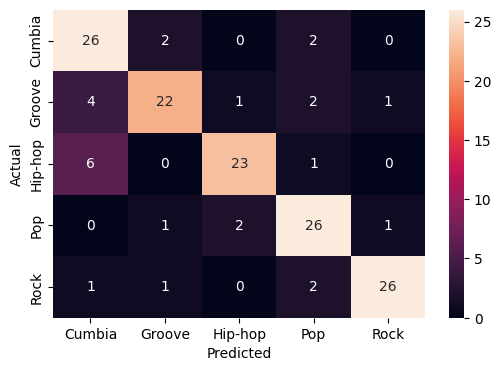

              precision    recall  f1-score   support

      Cumbia       0.70      0.87      0.78        30
      Groove       0.85      0.73      0.79        30
     Hip-hop       0.88      0.77      0.82        30
         Pop       0.79      0.87      0.83        30
        Rock       0.93      0.87      0.90        30

    accuracy                           0.82       150
   macro avg       0.83      0.82      0.82       150
weighted avg       0.83      0.82      0.82       150



In [68]:
from sklearn.metrics import confusion_matrix

categorias_nombres = ['Cumbia', 'Groove', 'Hip-hop', 'Pop', 'Rock']

conf_mat = confusion_matrix(categorias_test, y_pred)
fig, ax = plt.subplots(figsize=(6,4))

sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=categorias_nombres, yticklabels=categorias_nombres)


plt.ylabel('Actual')
plt.xlabel('Predicted')

plt.show()
print(metrics.classification_report(categorias_test, y_pred))

### Modelo Best Grid

In [74]:
from scipy.stats import pearsonr
from scipy import stats
from sklearn.model_selection import GridSearchCV
import statsmodels.api as sm
import math
from sklearn.ensemble import RandomForestClassifier
import multiprocessing
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import RepeatedKFold
from sklearn.inspection import permutation_importance
from sklearn import metrics

In [47]:
param_grid = {'n_estimators': [100,150,200,250],
              'max_features': [5, 7, 9],
              'max_depth'   : [None, 3, 10, 20],
              'criterion'   : ['gini', 'entropy']
             }


grid = GridSearchCV(
        estimator  = RandomForestClassifier(random_state = 123),
        param_grid = param_grid,
        scoring    = 'accuracy',
        n_jobs     = - 1,
        refit      = True,
        verbose    = 0,
        return_train_score = True
       )

grid.fit(X = train_a, y = categorias_train)


resultados = pd.DataFrame(grid.cv_results_)
resultados.filter(regex = '(param*|mean_t|std_t)') \
    .drop(columns = 'params') \
    .sort_values('mean_test_score', ascending = False) \
    .head(9)

,param_criterion,param_max_depth,param_max_features,param_n_estimators,mean_test_score,std_test_score,mean_train_score,std_train_score
87,entropy,20,5,250,0.768146,0.035053,1.0,0.0
51,entropy,None,5,250,0.767271,0.034329,1.0,0.0
3,gini,None,5,250,0.766896,0.035163,1.0,0.0
2,gini,None,5,200,0.766646,0.035304,1.0,0.0
50,entropy,None,5,200,0.766022,0.032922,1.0,0.0
86,entropy,20,5,200,0.765897,0.034901,1.0,0.0
39,gini,20,5,250,0.765896,0.036337,1.0,0.0
38,gini,20,5,200,0.765646,0.036200,1.0,0.0
85,entropy,20,5,150,0.764772,0.035435,1.0,0.0


In [54]:
modelo_gridbest = grid.best_estimator_
modelo_gridbest

RandomForestClassifier(criterion='entropy', max_depth=20, max_features=5,
                       n_estimators=250, random_state=123)

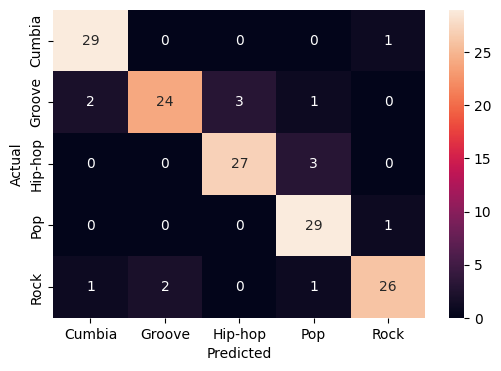

              precision    recall  f1-score   support

      Cumbia       0.91      0.97      0.94        30
      Groove       0.92      0.80      0.86        30
     Hip-hop       0.90      0.90      0.90        30
         Pop       0.85      0.97      0.91        30
        Rock       0.93      0.87      0.90        30

    accuracy                           0.90       150
   macro avg       0.90      0.90      0.90       150
weighted avg       0.90      0.90      0.90       150



In [55]:
categorias_nombres = ['Cumbia', 'Groove', 'Hip-hop', 'Pop', 'Rock']

y_pred = modelo_gridbest.predict(test_a)

conf_mat = confusion_matrix(categorias_test, y_pred)
fig, ax = plt.subplots(figsize=(6,4))

sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=categorias_nombres, yticklabels=categorias_nombres)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()
print(metrics.classification_report(categorias_test, y_pred))

In [56]:
importancia_predictores = pd.DataFrame(
                            {'predictor': train_a.columns,
                             'importancia': modelo_gridbest.feature_importances_}
                            )
print("Importancia de los predictores en el modelo")
print("-------------------------------------------")
importancia_predictores.sort_values('importancia', ascending=False)

Importancia de los predictores en el modelo
-------------------------------------------


,predictor,importancia
9,speechiness,0.177990
12,valence,0.133460
1,danceability,0.112414
0,acousticness,0.108020
4,instrumentalness,0.087047
10,tempo,0.058078
2,duration_ms,0.057425
7,loudness,0.055770
14,fade_out_duration,0.054873
3,energy,0.051954


In [57]:
# Predicción de probabilidades
predicciones = modelo_gridbest.predict_proba(X = train_a)
predicciones[:5, :]

array([[0.828, 0.08 , 0.012, 0.064, 0.016],
       [0.884, 0.064, 0.008, 0.04 , 0.004],
       [0.98 , 0.008, 0.   , 0.008, 0.004],
       [0.872, 0.02 , 0.004, 0.08 , 0.024],
       [0.988, 0.012, 0.   , 0.   , 0.   ]])

In [58]:
etiquetas = {0: 'cumbia', 1: 'Groove', 2: 'Hip-Hop', 3: 'Pop', 4: 'Rock'}
df_predicciones = pd.DataFrame(data=predicciones, columns=['Cumbia', 'Groove','Hip-hop','Pop','Rock'])
df_predicciones['clasificacion mas alta'] = np.argmax(df_predicciones.values, axis=1)
df_predicciones['clasificacion mas alta'] = df_predicciones['clasificacion mas alta'].map(etiquetas)
df_predicciones.head(10)

,Cumbia,Groove,Hip-hop,Pop,Rock,clasificacion mas alta
0,0.828,0.080,0.012,0.064,0.016,cumbia
1,0.884,0.064,0.008,0.040,0.004,cumbia
2,0.980,0.008,0.000,0.008,0.004,cumbia
3,0.872,0.020,0.004,0.080,0.024,cumbia
4,0.988,0.012,0.000,0.000,0.000,cumbia
5,0.952,0.020,0.008,0.016,0.004,cumbia
6,0.964,0.004,0.004,0.020,0.008,cumbia
7,0.964,0.012,0.004,0.016,0.004,cumbia
8,0.876,0.104,0.004,0.004,0.012,cumbia
9,0.964,0.032,0.000,0.004,0.000,cumbia


## Modelo en base a número de ingresos nuevos.
Como se comporta con el ingreso de nuevos registros

### Modelo Random Forest

In [7]:
o_categorias = ['Cumbia', 'Rock', 'Pop', 'Groove', 'Hip-hop']
dataframes_por_categoria = {}
bcate = todoelset.copy()
bcate = bcate
for categoria in o_categorias:
    df_categoria = bcate[bcate['categoria'] == categoria]
    dataframes_por_categoria[categoria] = df_categoria


df_cat_cumb = dataframes_por_categoria['Cumbia']
df_cat_rock = dataframes_por_categoria['Rock']
df_cat_pop = dataframes_por_categoria['Pop']
df_cat_groove = dataframes_por_categoria['Groove']
df_cat_hiphop = dataframes_por_categoria['Hip-hop']

unaxuna = pd.DataFrame()
unaxuna = pd.DataFrame(columns=bcate.columns)

tam_cat = len(dataframes_por_categoria['Rock'])
for i in range(tam_cat): 
    fila_cum = df_cat_cumb.iloc[i]
    unaxuna = unaxuna.append(fila_cum, ignore_index=True)
    fila_rock = df_cat_rock.iloc[i]
    unaxuna = unaxuna.append(fila_rock, ignore_index=True) 
    fila_pop = df_cat_pop.iloc[i]
    unaxuna = unaxuna.append(fila_pop, ignore_index=True)
    fila_groove = df_cat_groove.iloc[i]
    unaxuna = unaxuna.append(fila_groove, ignore_index=True)
    fila_hh = df_cat_hiphop.iloc[i]
    unaxuna = unaxuna.append(fila_hh, ignore_index=True)               

print(unaxuna.shape)

(7605, 24)


In [63]:
unaxuna.shape

(7605, 24)

In [66]:
def lemon_tree(bqp_cat,bqp_num,muestra_cat,muestra_num):
  y_train = bqp_cat
  X_train = bqp_num
  y_test = muestra_cat
  X_test = muestra_num
  modelo_treeclass = RandomForestClassifier(criterion='entropy', max_depth=20, max_features=5, n_estimators=250, random_state=123)
  modelo_treeclass.fit(X_train, y_train)
  y_pred = modelo_treeclass.predict(X_test)
  accuracy = accuracy_score(y_test, y_pred)
  return accuracy

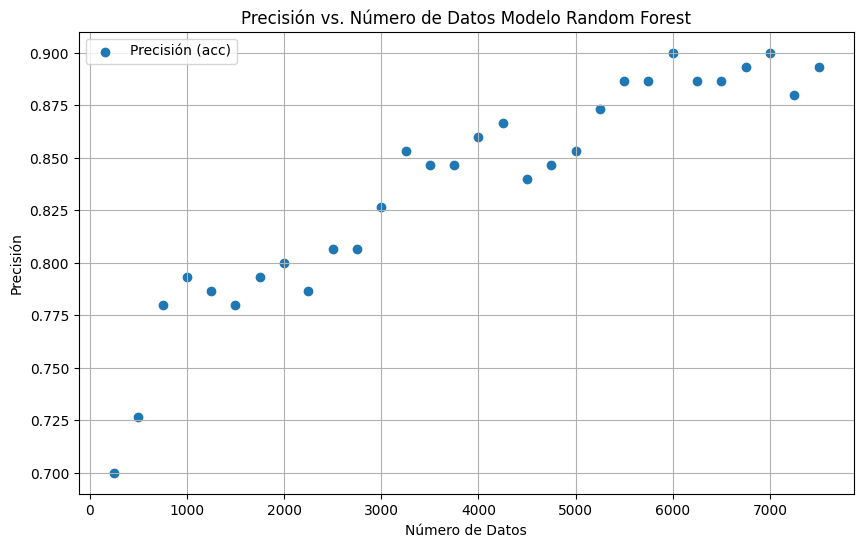

In [78]:
x = 50
datos_entreno = []
acc_values = []
num_datos_values = []

train_b = unaxuna.copy()
train_b = std(train_b)
categorias_test_b = unaxuna.copy()
categorias_test_b = categorias_test_b['categoria']


while x <= 1500 :
    dm = {}
    tamx = x * 5
    bqp = train_b.head(tamx) 
    bqp_cat = categorias_test_b.head(tamx)
    acc = lemon_tree(bqp_cat,bqp,categorias_test,test_a)
    dm['acc'] = acc
    dm['Num_datos'] = x

    acc_values.append(acc)
    num_datos_values.append(tamx)


    x = 50 + x


plt.figure(figsize=(10, 6))
plt.scatter(num_datos_values, acc_values, label='Precisión (acc)')
plt.xlabel('Número de Datos')
plt.ylabel('Precisión')
plt.title('Precisión vs. Número de Datos Modelo Random Forest')
plt.legend()
plt.grid(True)
plt.show()

### Modelo Regresiòn Logistica

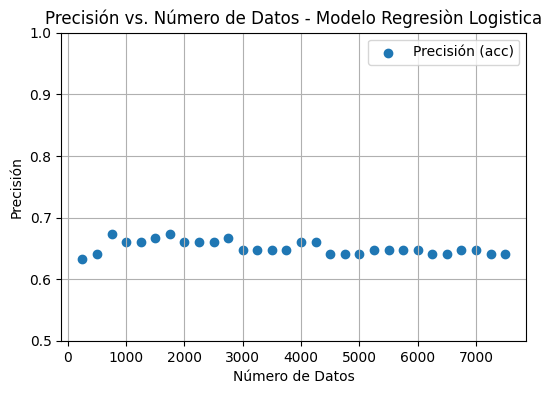

In [82]:
from sklearn.linear_model import LogisticRegression
x = 50
datos_entreno = []
acc_values = []
num_datos_values = []

train_b = unaxuna.copy()
train_b = std(train_b)
categorias_train_b = unaxuna.copy()
categorias_train_b = categorias_train_b['categoria']

modelo_logistico = LogisticRegression()

while x <= 1500 :
    dm = {}
    tamx = x * 5
    bqp = train_b.head(tamx) 
    bqp_cat = categorias_train_b.head(tamx)
 
    modelo_logistico.fit(bqp, bqp_cat)
    y_pred = modelo_logistico.predict(test_a)
    acc = accuracy_score(categorias_test , y_pred)
    dm['acc'] = acc
    dm['Num_datos'] = x

    acc_values.append(acc)
    num_datos_values.append(tamx)


    x = 50 + x


plt.figure(figsize=(6, 4))
plt.scatter(num_datos_values, acc_values, label='Precisión (acc)')
plt.xlabel('Número de Datos')
plt.ylabel('Precisión')
plt.title('Precisión vs. Número de Datos - Modelo Regre Log')
plt.ylim(0.5, 1)
plt.legend()
plt.grid(True)
plt.show()

### Modelo Knn - 3

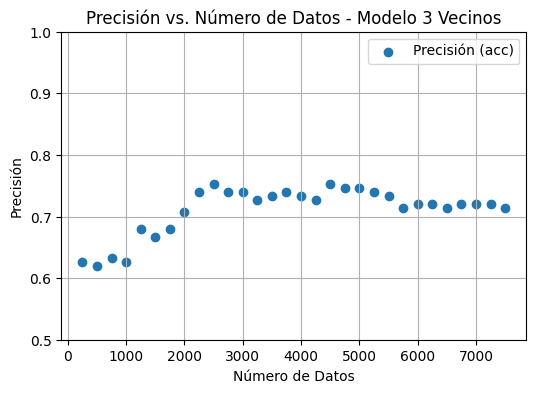

In [83]:
from sklearn.neighbors import KNeighborsClassifier

x = 50
datos_entreno = []
acc_values = []
num_datos_values = []

train_b = unaxuna.copy()
train_b = std(train_b)
categorias_train_b = unaxuna.copy()
categorias_train_b = categorias_train_b['categoria']

modelo_knn = KNeighborsClassifier(n_neighbors=3)



while x <= 1500 :
    dm = {}
    tamx = x * 5
    bqp = train_b.head(tamx) 
    bqp_cat = categorias_train_b.head(tamx)
    modelo_knn.fit(bqp, bqp_cat)
    y_pred = modelo_knn.predict(test_a)
    acc = accuracy_score(categorias_test , y_pred)
    dm['acc'] = acc
    dm['Num_datos'] = x

    acc_values.append(acc)
    num_datos_values.append(tamx)


    x = 50 + x


plt.figure(figsize=(6, 4))
plt.scatter(num_datos_values, acc_values, label='Precisión (acc)')
plt.xlabel('Número de Datos')
plt.ylabel('Precisión')
plt.title('Precisión vs. Número de Datos - Modelo 3 Vecinos')
plt.ylim(0.5, 1)
plt.legend()
plt.grid(True)
plt.show()

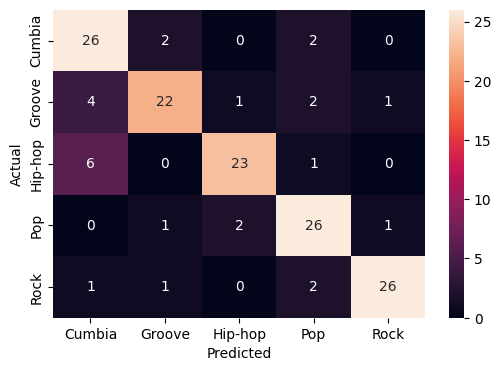

              precision    recall  f1-score   support

      Cumbia       0.70      0.87      0.78        30
      Groove       0.85      0.73      0.79        30
     Hip-hop       0.88      0.77      0.82        30
         Pop       0.79      0.87      0.83        30
        Rock       0.93      0.87      0.90        30

    accuracy                           0.82       150
   macro avg       0.83      0.82      0.82       150
weighted avg       0.83      0.82      0.82       150



In [65]:
from sklearn.neighbors import KNeighborsClassifier

train_b = unaxuna.copy()
train_b = std(train_b)
categorias_train_b = unaxuna.copy()
categorias_train_b = categorias_train_b['categoria']

modelo_knn_3 = KNeighborsClassifier(n_neighbors=3,weights='distance',algorithm='ball_tree',leaf_size=100)

bqp = train_b.head(6500) 
bqp_cat = categorias_train_b.head(6500)
modelo_knn_3.fit(bqp, bqp_cat)
y_pred = modelo_knn_3.predict(test_a)

categorias_nombres = ['Cumbia', 'Groove', 'Hip-hop', 'Pop', 'Rock']

conf_mat = confusion_matrix(categorias_test, y_pred)
fig, ax = plt.subplots(figsize=(6,4))

sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=categorias_nombres, yticklabels=categorias_nombres)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()
print(metrics.classification_report(categorias_test, y_pred))

In [66]:
predicciones = modelo_knn_3.predict_proba(X = train_a)
predicciones[:5, :]

array([[1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.],
       [1., 0., 0., 0., 0.]])

### Modelo Knn - 5

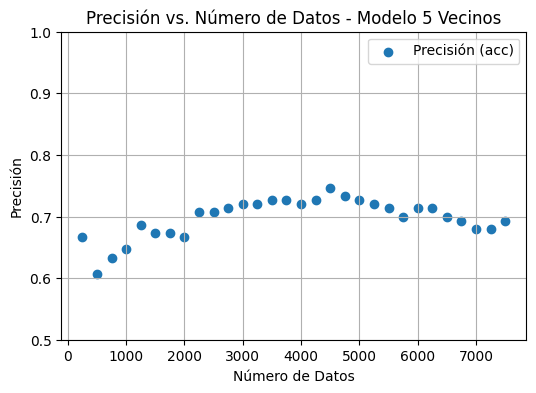

In [84]:
x = 50
datos_entreno = []
acc_values = []
num_datos_values = []

train_b = unaxuna.copy()
train_b = std(train_b)
categorias_train_b = unaxuna.copy()
categorias_train_b = categorias_train_b['categoria']

modelo_knn = KNeighborsClassifier(n_neighbors=5)

while x <= 1500 :
    dm = {}
    tamx = x * 5
    bqp = train_b.head(tamx) 
    bqp_cat = categorias_train_b.head(tamx)
    modelo_knn.fit(bqp, bqp_cat)
    y_pred = modelo_knn.predict(test_a)
    acc = accuracy_score(categorias_test , y_pred)
    dm['acc'] = acc
    dm['Num_datos'] = x

    acc_values.append(acc)
    num_datos_values.append(tamx)


    x = 50 + x


plt.figure(figsize=(6, 4))
plt.scatter(num_datos_values, acc_values, label='Precisión (acc)')
plt.xlabel('Número de Datos')
plt.ylabel('Precisión')
plt.title('Precisión vs. Número de Datos - Modelo 5 Vecinos')
plt.ylim(0.5, 1)
plt.legend()
plt.grid(True)
plt.show()

### Modelo Knn - 7

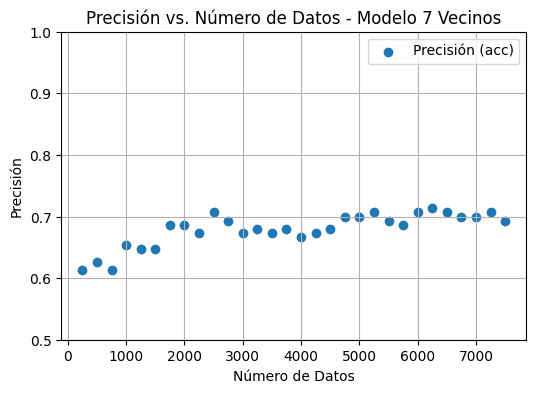

In [85]:
x = 50
datos_entreno = []
acc_values = []
num_datos_values = []

train_b = unaxuna.copy()
train_b = std(train_b)
categorias_train_b = unaxuna.copy()
categorias_train_b = categorias_train_b['categoria']
modelo_knn = KNeighborsClassifier(n_neighbors=7)
while x <= 1500 :
    dm = {}
    tamx = x * 5
    bqp = train_b.head(tamx) 
    bqp_cat = categorias_train_b.head(tamx)
    modelo_knn.fit(bqp, bqp_cat)
    y_pred = modelo_knn.predict(test_a)
    acc = accuracy_score(categorias_test , y_pred)
    dm['acc'] = acc
    dm['Num_datos'] = x
    acc_values.append(acc)
    num_datos_values.append(tamx)
    x = 50 + x

plt.figure(figsize=(6, 4))
plt.scatter(num_datos_values, acc_values, label='Precisión (acc)')
plt.xlabel('Número de Datos')
plt.ylabel('Precisión')
plt.title('Precisión vs. Número de Datos - Modelo 7 Vecinos')
plt.ylim(0.5, 1)
plt.legend()
plt.grid(True)
plt.show()

### Modelo Gaussiano

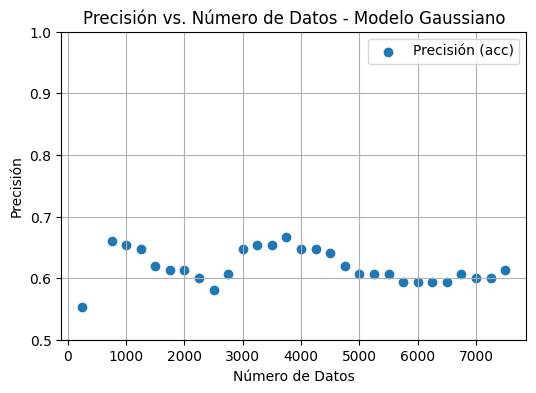

In [86]:
from sklearn.naive_bayes import GaussianNB

x = 50
datos_entreno = []
acc_values = []
num_datos_values = []

train_b = unaxuna.copy()
train_b = std(train_b)
categorias_train_b = unaxuna.copy()
categorias_train_b = categorias_train_b['categoria']

modelo_nb = GaussianNB()

while x <= 1500 :
    dm = {}
    tamx = x * 5
    bqp = train_b.head(tamx) 
    bqp_cat = categorias_train_b.head(tamx)
    modelo_nb.fit(bqp, bqp_cat)
    y_pred = modelo_nb.predict(test_a)
    acc = accuracy_score(categorias_test , y_pred)
    dm['acc'] = acc
    dm['Num_datos'] = x

    acc_values.append(acc)
    num_datos_values.append(tamx)


    x = 50 + x


plt.figure(figsize=(6, 4))
plt.scatter(num_datos_values, acc_values, label='Precisión (acc)')
plt.xlabel('Número de Datos')
plt.ylabel('Precisión')
plt.title('Precisión vs. Número de Datos - Modelo Gaussiano')
plt.ylim(0.5, 1)
plt.legend()
plt.grid(True)
plt.show()

## Modelo Basado en redes neuronales
Preparacion y creacion de redes neuronales en bases a los segmentos de la cancion.  

### Preparaciòn Datos

In [41]:
train_c = unaxuna.copy()
categoria_train_c = train_c.copy()
categoria_train_c = categoria_train_c['categoria']
categoria_test_c = bmuestra.copy()
categoria_test_c = categoria_test_c['categoria']

mapeo = {
    'Groove': 0,
    'Cumbia': 1,
    'Hip-hop': 2,
    'Rock': 3,
    'Pop': 4
}

cat_train_c= categoria_train_c.replace(mapeo)
cat_test= categoria_test_c.replace(mapeo)

In [9]:
beats_lista = train_c['beats']
segments_lista = train_c['segments']
i = 0

seg_dataset = []
for seg in segments_lista:
    segments_df = pd.DataFrame(seg)
    pitchea = segments_df['pitches'].apply(lambda x: pd.Series(x))
    pitchea = pitchea.add_prefix("pitch_")
    timbrea = segments_df['timbre'].apply(lambda x: pd.Series(x))
    timbrea = timbrea.add_prefix("timbre_")
    segments_df = segments_df.drop(['pitches', 'timbre'], axis=1)
    segments_total = pd.concat([segments_df, timbrea,pitchea], axis=1)
    seg_dataset.append(segments_total)
    print(i)
    i = 1 + i

beats_dataset = []
for beat in beats_lista:
    beat_df = pd.DataFrame(beat)
    beats_dataset.append(beat_df)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

In [10]:
beats_lista_muestra = bmuestra['beats']
segments_lista_muestra = bmuestra['segments']

seg_dataset_muestra = []
for seg in segments_lista_muestra:
    segments_df = pd.DataFrame(seg)
    pitchea = segments_df['pitches'].apply(lambda x: pd.Series(x))
    pitchea = pitchea.add_prefix("pitch_")
    timbrea = segments_df['timbre'].apply(lambda x: pd.Series(x))
    timbrea = timbrea.add_prefix("timbre_")
    segments_df = segments_df.drop(['pitches', 'timbre'], axis=1)
    segments_total = pd.concat([segments_df, timbrea,pitchea], axis=1)
    seg_dataset_muestra.append(segments_total)

beats_dataset_muestra = []
for beat in beats_lista_muestra:
    beat_df = pd.DataFrame(beat)
    beats_dataset_muestra.append(beat_df)

In [11]:
los_timb = seg_dataset
miy = 600

for item in los_timb:
    if item.shape[0] < miy:
        miy = item.shape[0]

print(miy)

79


In [12]:
los_timb = seg_dataset
aseg = []
columnas_timbres = ['timbre_0',	'timbre_1',	'timbre_2',	'timbre_3',	'timbre_4',	'timbre_5',
                      'timbre_6',	'timbre_7',	'timbre_8','timbre_9',	'timbre_10',	'timbre_11']

max = 0
min = 0
dur_max = 0

for item in los_timb:
  for tim in columnas_timbres:
    tmax = item[tim].max()
    tmin = item[tim].min()
    if tmax > max:
      max = tmax
    if tmin < min:
      min = tmin
  item = item[item['start'] > 0]
  item = item.head(78)
  item = item.reset_index(drop=True)
  sdmax = item['duration'].max()
  if sdmax >= dur_max:
     dur_max = sdmax

for item in los_timb:
    item = item[item['start'] > 0]
    item = item.head(78)
    item = item.reset_index(drop=True)
    item['loudness_max'] = (item['loudness_max'] + 60 ) / 70
    col_eli = ['start']
    item = item.drop(col_eli, axis=1)
    item['duration'] = item['duration'] / dur_max
    for tim in columnas_timbres:
        item[tim] = (item[tim] - min) / (max - min)

    aseg.append(item)

print(max)
print(min)
print(dur_max)

679.97
-497.316
6.04866


In [13]:
los_timb_muestra = seg_dataset_muestra
aseg_muestra = []

for item in los_timb_muestra:
    item = item[item['start'] > 30]
    item = item.head(78)
    item = item.reset_index(drop=True)
    item['loudness_max'] = (item['loudness_max'] + 60 ) / 70
    col_eli = ['start']
    item = item.drop(col_eli, axis=1)
    item['duration'] = item['duration'] / dur_max
    for tim in columnas_timbres:
        item[tim] = (item[tim] - min) / (max - min)

    aseg_muestra.append(item)

### Red Neuronal con tres capas y optimizer Adagrad

In [14]:
from sklearn.preprocessing import StandardScaler
from tensorflow import keras
from tensorflow.keras import layers

X_train = np.array([df.values for df in aseg])
y_train = np.array(cat_train_c)

X_test = np.array([df.values for df in aseg_muestra])
y_test = np.array(cat_test)


modelb = keras.Sequential()
modelb.add(layers.Flatten(input_shape=(78, 26)))
modelb.add(layers.Dense(64, activation='relu'))
modelb.add(layers.Dense(128, activation='relu'))
modelb.add(layers.Dense(128, activation='relu'))
modelb.add(layers.Dense(5, activation='softmax'))


modelb.compile(optimizer='Adagrad', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

history = modelb.fit(X_train, y_train, epochs=400, batch_size=80, validation_data=(X_test, y_test),verbose=0)

loss, accuracy = modelb.evaluate(X_test, y_test)
print(f'Precisión en datos de prueba: {accuracy}')

5/5 [==============================] - 0s 17ms/step - loss: 1.5402 - accuracy: 0.3933
Precisión en datos de prueba: 0.3933333456516266


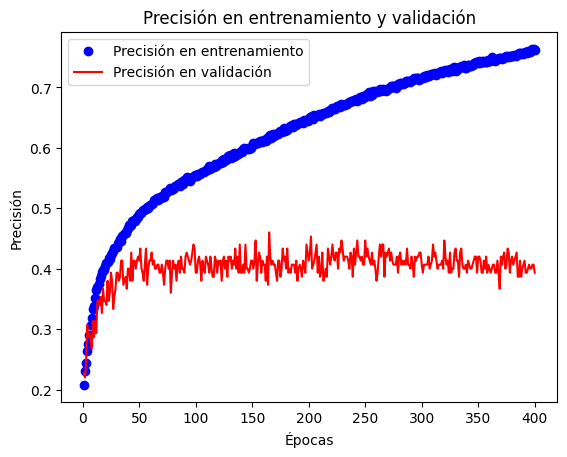

In [15]:
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']


epochs = range(1, len(training_accuracy) + 1)

plt.plot(epochs, training_accuracy, 'bo', label='Precisión en entrenamiento')
plt.plot(epochs, validation_accuracy, 'r', label='Precisión en validación')
plt.title('Precisión en entrenamiento y validación')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.legend()

plt.show()

### Red Neuronal con tres capas y optimizer Adam

In [42]:
from tensorflow.keras import layers

X_train = np.array([df.values for df in aseg])
y_train = np.array(cat_train_c)

X_test = np.array([df.values for df in aseg_muestra])
y_test = np.array(cat_test)

modelbb = keras.Sequential()
modelbb.add(layers.Flatten(input_shape=(78, 26)))
modelbb.add(layers.Dense(64, activation='relu'))
modelbb.add(layers.Dense(128, activation='relu'))
modelbb.add(layers.Dense(128, activation='relu'))
modelbb.add(layers.Dense(5, activation='softmax'))


modelbb.compile(optimizer='Adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

historyb = modelbb.fit(X_train, y_train, epochs=700, batch_size=80, validation_data=(X_test, y_test),verbose=0)

loss, accuracy = modelbb.evaluate(X_test, y_test)
print(f'Precisión en datos de prueba: {accuracy}')

5/5 [==============================] - 0s 6ms/step - loss: 6.3967 - accuracy: 0.3733
Precisión en datos de prueba: 0.3733333349227905


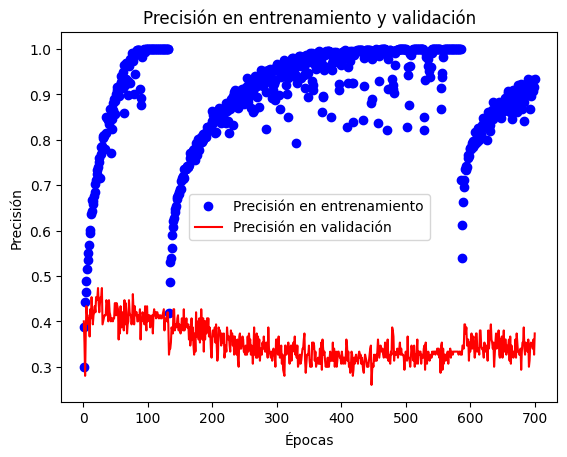

In [44]:
training_accuracy = historyb.history['accuracy']
validation_accuracy = historyb.history['val_accuracy']


epochs = range(1, len(training_accuracy) + 1)

plt.plot(epochs, training_accuracy, 'bo', label='Precisión en entrenamiento')
plt.plot(epochs, validation_accuracy, 'r', label='Precisión en validación')
plt.title('Precisión en entrenamiento y validación')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.legend()

plt.show()

### Red Neuronal combinado con Knn con 7 capas

5/5 [==============================] - 0s 248us/step
Época 1 - Precisión del modelo combinado (NN + k-NN): 0.24
5/5 [==============================] - 0s 4ms/step
Época 2 - Precisión del modelo combinado (NN + k-NN): 0.2733333333333333
5/5 [==============================] - 0s 267us/step
Época 3 - Precisión del modelo combinado (NN + k-NN): 0.19333333333333333
5/5 [==============================] - 0s 4ms/step
Época 4 - Precisión del modelo combinado (NN + k-NN): 0.26666666666666666
5/5 [==============================] - 0s 3ms/step
Época 5 - Precisión del modelo combinado (NN + k-NN): 0.28
5/5 [==============================] - 0s 4ms/step
Época 6 - Precisión del modelo combinado (NN + k-NN): 0.30666666666666664
5/5 [==============================] - 0s 4ms/step
Época 7 - Precisión del modelo combinado (NN + k-NN): 0.2866666666666667
5/5 [==============================] - 0s 4ms/step
Época 8 - Precisión del modelo combinado (NN + k-NN): 0.29333333333333333
5/5 [=======================

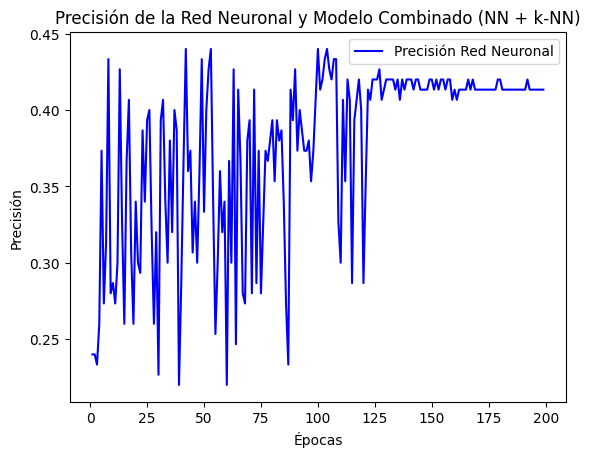

In [16]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.optimizers import SGD
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Crear el modelo de la red neuronal
model = Sequential()
model.add(Flatten(input_shape=(78, 26)))
model.add(Dense(64, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(64, activation='relu'))
model.add(Dense(32, activation='relu', name='nombre_capa_intermedia'))
model.add(Dense(5, activation='softmax'))

# Compilar el modelo de la red neuronal
model.compile(optimizer=SGD(), loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Lista para almacenar la precisión en cada época
accuracy_history_nn = []

# Obtener el índice de la capa intermedia por nombre
index_of_intermediate_layer = model.layers.index(model.get_layer('nombre_capa_intermedia'))

# Iterar sobre las épocas
for epoch in range(1, 200):
    # Entrenar el modelo de la red neuronal
    history = model.fit(X_train, y_train, epochs=1, batch_size=40, validation_data=(X_test, y_test), verbose=0)
    
    # Evaluar el modelo de la red neuronal en datos de prueba
    loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
    accuracy_history_nn.append(accuracy)

    # Obtener las representaciones intermedias
    representation_model = keras.Model(inputs=model.input, outputs=model.get_layer('nombre_capa_intermedia').output)
    X_train_rep = representation_model.predict(X_train)
    X_test_rep = representation_model.predict(X_test)

    # Reducción de Dimensionalidad (Opcional)
    # pca = PCA(n_components=nueva_dimension)
    # X_train_rep = pca.fit_transform(X_train_rep)
    # X_test_rep = pca.transform(X_test_rep)

    # Entrenar el k-NN
    knn_classifier = KNeighborsClassifier(n_neighbors=5)
    knn_classifier.fit(X_train_rep, y_train)

    # Evaluar el k-NN en datos de prueba
    accuracy_knn = knn_classifier.score(X_test_rep, y_test)

    # Imprimir la precisión combinada
    print(f'Época {epoch} - Precisión del modelo combinado (NN + k-NN): {accuracy_knn}')

# Graficar la precisión de la red neuronal y el modelo combinado
epochs = range(1, 200)

plt.plot(epochs, accuracy_history_nn, 'b', label='Precisión Red Neuronal')
plt.title('Precisión de la Red Neuronal y Modelo Combinado (NN + k-NN)')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.legend()
plt.show()

### Red Neuronal combinado con Knn con 3 capas

5/5 [==============================] - 0s 4ms/step
Época 1 - Precisión del modelo combinado (NN + k-NN): 0.2733333333333333
5/5 [==============================] - 0s 4ms/step
Época 2 - Precisión del modelo combinado (NN + k-NN): 0.22
5/5 [==============================] - 0s 4ms/step
Época 3 - Precisión del modelo combinado (NN + k-NN): 0.25333333333333335
5/5 [==============================] - 0s 4ms/step
Época 4 - Precisión del modelo combinado (NN + k-NN): 0.22
5/5 [==============================] - 0s 4ms/step
Época 5 - Precisión del modelo combinado (NN + k-NN): 0.2866666666666667
5/5 [==============================] - 0s 4ms/step
Época 6 - Precisión del modelo combinado (NN + k-NN): 0.2866666666666667
5/5 [==============================] - 0s 73us/step
Época 7 - Precisión del modelo combinado (NN + k-NN): 0.26666666666666666
5/5 [==============================] - 0s 4ms/step
Época 8 - Precisión del modelo combinado (NN + k-NN): 0.2866666666666667
5/5 [============================

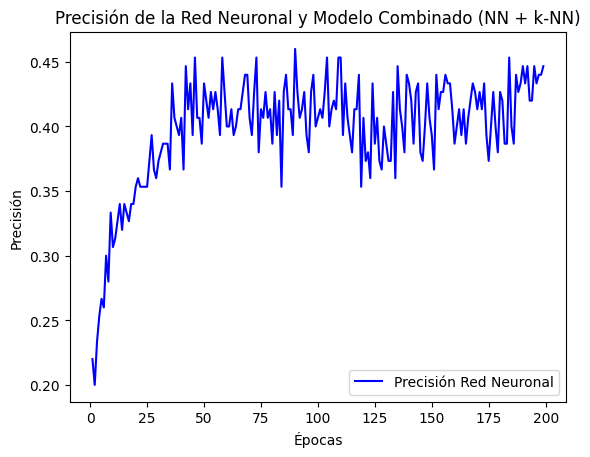

In [17]:
model = Sequential()
model.add(Flatten(input_shape=(78, 26)))
model.add(Dense(64, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(128, activation='relu', name='nombre_capa_intermedia'))
model.add(Dense(5, activation='softmax'))

# Compilar el modelo de la red neuronal
model.compile(optimizer='Adagrad', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Lista para almacenar la precisión en cada época
accuracy_history_nn = []

# Obtener el índice de la capa intermedia por nombre
index_of_intermediate_layer = model.layers.index(model.get_layer('nombre_capa_intermedia'))

# Iterar sobre las épocas
for epoch in range(1, 200):
    # Entrenar el modelo de la red neuronal
    history = model.fit(X_train, y_train, epochs=1, batch_size=80, validation_data=(X_test, y_test), verbose=0)
    
    # Evaluar el modelo de la red neuronal en datos de prueba
    loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
    accuracy_history_nn.append(accuracy)

    # Obtener las representaciones intermedias
    representation_model = keras.Model(inputs=model.input, outputs=model.get_layer('nombre_capa_intermedia').output)
    X_train_rep = representation_model.predict(X_train)
    X_test_rep = representation_model.predict(X_test)

    # Reducción de Dimensionalidad (Opcional)
    pca = PCA(n_components=9)
    X_train_rep = pca.fit_transform(X_train_rep)
    X_test_rep = pca.transform(X_test_rep)

    # Entrenar el k-NN
    knn_classifier = KNeighborsClassifier(n_neighbors=7)
    knn_classifier.fit(X_train_rep, y_train)

    # Evaluar el k-NN en datos de prueba
    accuracy_knn = knn_classifier.score(X_test_rep, y_test)

    # Imprimir la precisión combinada
    print(f'Época {epoch} - Precisión del modelo combinado (NN + k-NN): {accuracy_knn}')

# Graficar la precisión de la red neuronal y el modelo combinado
epochs = range(1, 200)

plt.plot(epochs, accuracy_history_nn, 'b', label='Precisión Red Neuronal')
plt.title('Precisión de la Red Neuronal y Modelo Combinado (NN + k-NN)')
plt.xlabel('Épocas')
plt.ylabel('Precisión')
plt.legend()
plt.show()

# Fase 5. Evaluacion
Revisar y comparar los resultados arrojados para el mejor modelo encontrado, haciendo enfasis en las probabilidades por generos generadas. 

### Evaluaciòn Muestra

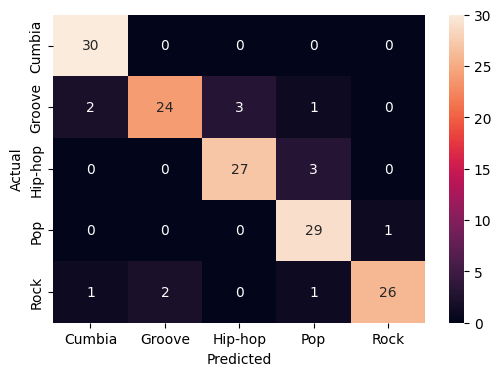

              precision    recall  f1-score   support

      Cumbia       0.91      1.00      0.95        30
      Groove       0.92      0.80      0.86        30
     Hip-hop       0.90      0.90      0.90        30
         Pop       0.85      0.97      0.91        30
        Rock       0.96      0.87      0.91        30

    accuracy                           0.91       150
   macro avg       0.91      0.91      0.91       150
weighted avg       0.91      0.91      0.91       150



In [75]:
train_eva = unaxuna.copy()
train_eva = std(train_eva)
categorias_train_eva = unaxuna.copy()
categorias_train_eva = categorias_train_eva['categoria']

modelo_Random_forest = RandomForestClassifier(criterion='entropy', max_depth=20, max_features=5, n_estimators=250, random_state=123)
modelo_Random_forest.fit(train_eva, categorias_train_eva)
y_pred = modelo_Random_forest.predict(test_a)

categorias_nombres = ['Cumbia', 'Groove', 'Hip-hop', 'Pop', 'Rock']

conf_mat = confusion_matrix(categorias_test, y_pred)
fig, ax = plt.subplots(figsize=(6,4))

sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=categorias_nombres, yticklabels=categorias_nombres)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.show()
print(metrics.classification_report(categorias_test, y_pred))

In [76]:
predicciones = modelo_Random_forest.predict_proba(X = test_a)
predicciones[:5, :]

array([[0.032, 0.804, 0.06 , 0.028, 0.076],
       [0.508, 0.3  , 0.012, 0.044, 0.136],
       [0.168, 0.252, 0.248, 0.236, 0.096],
       [0.196, 0.712, 0.02 , 0.024, 0.048],
       [0.192, 0.68 , 0.06 , 0.036, 0.032]])

In [83]:
Gen_muestra = pd.DataFrame(Gen_muestra)
categorias_test_eva = bmuestra['categoria']
categorias_test_eva = pd.DataFrame(categorias_test_eva)

In [100]:

etiquetas = {0: 'Cumbia', 1: 'Groove', 2: 'Hip-hop', 3: 'Pop', 4: 'Rock'}
df_predicciones = pd.DataFrame(data=predicciones, columns=['Cumbia', 'Groove','Hip-hop','Pop','Rock'])
df_predicciones['clasificacion mas alta'] = np.argmax(df_predicciones.values, axis=1)
df_predicciones['clasificacion mas alta'] = df_predicciones['clasificacion mas alta'].map(etiquetas)
df_predicciones.head(10)

,Cumbia,Groove,Hip-hop,Pop,Rock,clasificacion mas alta
0,0.032000,0.804000,0.060,0.028000,0.076,Groove
1,0.508000,0.300000,0.012,0.044000,0.136,Cumbia
2,0.168000,0.252000,0.248,0.236000,0.096,Groove
3,0.196000,0.712000,0.020,0.024000,0.048,Groove
4,0.192000,0.680000,0.060,0.036000,0.032,Groove
5,0.136000,0.756000,0.040,0.020000,0.048,Groove
6,0.252000,0.604000,0.016,0.028000,0.100,Groove
7,0.172000,0.652000,0.040,0.064000,0.072,Groove
8,0.132000,0.716000,0.016,0.016000,0.120,Groove
9,0.124541,0.792108,0.004,0.051351,0.028,Groove


In [101]:
evaluacion_muestra = pd.concat([df_predicciones,categorias_test_eva,Gen_muestra], axis=1)
evaluacion_muestra['std'] = evaluacion_muestra.iloc[:, :5].std(axis=1)
evaluacion_muestra['misma_categoria'] = evaluacion_muestra['clasificacion mas alta'] == evaluacion_muestra['categoria']
evaluacion_muestra.head(5)

,Cumbia,Groove,Hip-hop,Pop,Rock,clasificacion mas alta,categoria,artistas,cancion_name,std,misma_categoria
0,0.032,0.804,0.060,0.028,0.076,Groove,Groove,Rudimental,Easy On Me,0.338231,True
1,0.508,0.300,0.012,0.044,0.136,Cumbia,Groove,The Jackson 5,I Want You Back,0.205329,False
2,0.168,0.252,0.248,0.236,0.096,Groove,Groove,Masego,Tadow,0.067350,True
3,0.196,0.712,0.020,0.024,0.048,Groove,Groove,CHIC,I Want Your Love,0.295229,True
4,0.192,0.680,0.060,0.036,0.032,Groove,Groove,Gwen McCrae,Funky Sensation,0.276217,True


In [174]:
evaluacion_muestra.to_csv('resultados_probabiidades_muestra.csv', index=False)

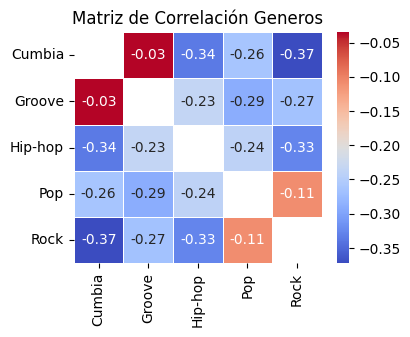

In [172]:
columnas_primeras_cinco = evaluacion_muestra.iloc[:, :5]

matriz_correlacion = columnas_primeras_cinco.corr()

plt.figure(figsize=(4, 3))
sns.heatmap(matriz_correlacion, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5, mask=matriz_correlacion == 1)
plt.title('Matriz de Correlación Generos')
plt.show()

In [173]:
matriz_correlacion

,Cumbia,Groove,Hip-hop,Pop,Rock
Cumbia,1.000000,-0.034800,-0.335659,-0.261790,-0.372262
Groove,-0.034800,1.000000,-0.234075,-0.289689,-0.266732
Hip-hop,-0.335659,-0.234075,1.000000,-0.240044,-0.326391
Pop,-0.261790,-0.289689,-0.240044,1.000000,-0.109512
Rock,-0.372262,-0.266732,-0.326391,-0.109512,1.000000


In [110]:
canciones_mal_asignadas = evaluacion_muestra[evaluacion_muestra['misma_categoria'] == False]
print('El numero de canciones mal asignadas es: ', canciones_mal_asignadas.shape[0])
canciones_mal_asignadas.head(20)

El numero de canciones mal asignadas es:  14


,Cumbia,Groove,Hip-hop,Pop,Rock,clasificacion mas alta,categoria,artistas,cancion_name,std,misma_categoria
1,0.5080,0.3000,0.012,0.044,0.136,Cumbia,Groove,The Jackson 5,I Want You Back,0.205329,False
10,0.6520,0.2800,0.004,0.040,0.024,Cumbia,Groove,Boney M.,Rasputin - Single Version,0.276449,False
16,0.0000,0.2640,0.708,0.000,0.028,Hip-hop,Groove,Stardust,Music Sounds Better With You - Radio Edit,0.304854,False
27,0.1040,0.0080,0.144,0.500,0.244,Pop,Groove,Robin Schulz,Sugar (feat. Francesco Yates),0.187851,False
28,0.0520,0.0680,0.408,0.292,0.180,Hip-hop,Groove,Calvin Harris,Promises (with Sam Smith),0.151208,False
29,0.0480,0.2520,0.648,0.012,0.040,Hip-hop,Groove,Rawayana,#Sádico - Puma Remix,0.268075,False
64,0.0360,0.1160,0.360,0.444,0.044,Pop,Hip-hop,Rihanna,Work,0.189357,False
76,0.2880,0.1640,0.088,0.380,0.080,Pop,Hip-hop,Alcolirykoz,No Está en Venta,0.130752,False
78,0.3080,0.1520,0.080,0.380,0.080,Pop,Hip-hop,Akon,Lonely,0.137084,False
105,0.2120,0.5040,0.008,0.112,0.164,Groove,Rock,KISS,I Was Made For Lovin' You,0.186054,False


In [164]:
promedio_desviacion = evaluacion_muestra.groupby(['clasificacion mas alta', 'misma_categoria'])['std'].mean()

# Imprimir el resultado
print(promedio_desviacion)

clasificacion mas alta  misma_categoria
Cumbia                  False              0.221080
                        True               0.309055
Groove                  False              0.177978
                        True               0.269170
Hip-hop                 False              0.241379
                        True               0.331904
Pop                     False              0.164372
                        True               0.257870
Rock                    False              0.272866
                        True               0.342437
Name: std, dtype: float64


Text(0.5, 0, 'Categoría')

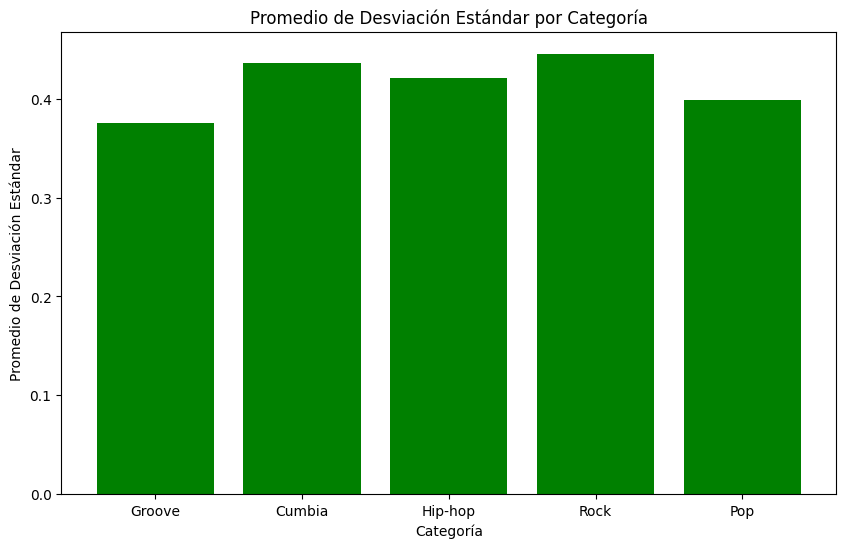

In [165]:
true_data = evaluacion_muestra[evaluacion_muestra['misma_categoria']]

fig, ax = plt.subplots(figsize=(10, 6))

ax.bar(true_data['categoria'], true_data['std'], color='green')

ax.set_title('Promedio de Desviación Estándar por Categoría')
ax.set_ylabel('Promedio de Desviación Estándar')
ax.set_xlabel('Categoría')

### Evaluacion canciones clasificadas en 2 generos

In [150]:
Repetidas.head()
semilla = 8885
np.random.seed(semilla)
filas_aleatorias = Repetidas.sample(n=8)
filas_aleatorias.head(4)

,ID,Cancion,Artista,rep,Nombre Pys,ID Pys,Genero Ant,Genero Fut
333,1OxcIUqVmVYxT6427tbhDW,Fly Away,Lenny Kravitz,7,hitch hiking music collection,https://open.spotify.com/playlist/5XJ1VX49FCRC...,Rock,Groove
274,2WfaOiMkCvy7F5fcp2zZ8L,Take on Me,a-ha,9,hitch hiking music collection,https://open.spotify.com/playlist/5XJ1VX49FCRC...,Rock,Groove
549,5PbFD3AIyunz5HxocduA9e,Flava in Ya Ear Remix (feat. The Notorious B.I...,Craig Mack,4,"Damn, that's Funky!",https://open.spotify.com/playlist/6j5Zap1IR7Yj...,Hip-hop,Groove
1065,78DVpEWwmJFC25KGz8fJuE,Clavado en Un Bar,Maná,7,Pop Latino Viejo,https://open.spotify.com/playlist/0W8QvU0Sn94O...,Rock,Pop


In [136]:
col_nec = ['ID','Cancion','Artista','Genero Ant','Genero Fut']
muestras_dos_generos = filas_aleatorias[col_nec]

resultados = []
Final_canciones = []
for index, row in muestras_dos_generos.iterrows():
    resultado = Datos_cancion(row['ID'], '2_gen')
    resultados.append(resultado)
Final_canciones.extend(resultados)
with open('Canciones_2_gen.json', 'w') as archivo:
    json.dump(Final_canciones, archivo)

In [145]:
with open('Canciones_2_gen.json', 'r') as archivo:
    g2g = json.load(archivo)
g2g = pd.DataFrame(g2g)
g2g = std(g2g)

In [149]:
predicciones_2g = modelo_Random_forest.predict_proba(X = g2g)
etiquetas = {0: 'Cumbia', 1: 'Groove', 2: 'Hip-hop', 3: 'Pop', 4: 'Rock'}
df_predicciones_2g = pd.DataFrame(data=predicciones_2g, columns=['Cumbia', 'Groove','Hip-hop','Pop','Rock'])
df_predicciones_2g['clasificacion mas alta'] = np.argmax(df_predicciones_2g.values, axis=1)
df_predicciones_2g['clasificacion mas alta'] = df_predicciones_2g['clasificacion mas alta'].map(etiquetas)
df_predicciones_2g.head(8)

,Cumbia,Groove,Hip-hop,Pop,Rock,clasificacion mas alta
0,0.104,0.192,0.036,0.232,0.436,Rock
1,0.072,0.448,0.008,0.064,0.408,Groove
2,0.064,0.212,0.664,0.012,0.048,Hip-hop
3,0.072,0.148,0.176,0.224,0.380,Rock
4,0.140,0.208,0.076,0.436,0.140,Pop
5,0.420,0.304,0.068,0.080,0.128,Cumbia
6,0.004,0.044,0.004,0.012,0.936,Rock
7,0.092,0.228,0.564,0.096,0.020,Hip-hop


In [162]:
muestras_dos_generos = muestras_dos_generos.reset_index(drop=True)
evaluacion_muestra_2g = pd.concat([df_predicciones_2g,muestras_dos_generos], axis=1)
evaluacion_muestra_2g['std'] = evaluacion_muestra_2g.iloc[:, :5].std(axis=1)
evaluacion_muestra_2g.drop('ID', axis=1, inplace=True)
evaluacion_muestra_2g.head(8)

,Cumbia,Groove,Hip-hop,Pop,Rock,clasificacion mas alta,Cancion,Artista,Genero Ant,Genero Fut,std
0,0.104,0.192,0.036,0.232,0.436,Rock,Fly Away,Lenny Kravitz,Rock,Groove,0.152394
1,0.072,0.448,0.008,0.064,0.408,Groove,Take on Me,a-ha,Rock,Groove,0.210067
2,0.064,0.212,0.664,0.012,0.048,Hip-hop,Flava in Ya Ear Remix (feat. The Notorious B.I...,Craig Mack,Hip-hop,Groove,0.270363
3,0.072,0.148,0.176,0.224,0.380,Rock,Clavado en Un Bar,Maná,Rock,Pop,0.114717
4,0.140,0.208,0.076,0.436,0.140,Pop,Can't Feel My Face,The Weeknd,Hip-hop,Pop,0.139943
5,0.420,0.304,0.068,0.080,0.128,Cumbia,La Tortura (feat. Alejandro Sanz),Shakira,Cumbia,Pop,0.155100
6,0.004,0.044,0.004,0.012,0.936,Rock,Come As You Are,Nirvana,Rock,Groove,0.411767
7,0.092,0.228,0.564,0.096,0.020,Hip-hop,Downtown,Anitta,Cumbia,Pop,0.216887
